In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import seaborn as sns
sns.set_context('poster',rc={"lines.linewidth":1})

/home/gjones/anaconda/envs/readout/lib/python2.7/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [3]:
import kid_readout.analysis.archive

/home/gjones/anaconda/envs/readout/lib/python2.7/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)
/home/gjones/anaconda/envs/readout/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


no data directory set up for clouds defaulting to /data
updated file list


In [4]:
import glob

In [5]:
fns = glob.glob('/artemis/readout/pkl/2016-02-27_1*.pkl')
#fns += glob.glob('/artemis/readout/pkl/2016-02-25_191442_cw_noise_test.pkl')
fns.sort()
print fns

['/artemis/readout/pkl/2016-02-27_115448_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_115751_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_120053_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_120356_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_120659_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_121002_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_121305_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_121608_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_121911_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_122214_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_122517_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_122820_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_123123_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_123427_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_123730_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_124034_cw_noise_test.pkl', '/artemis/readout/pkl/2016-02-27_124339

In [6]:
#plot_dir = '/artemis/readout/plots/2016-02-23-jpl-2015-10-park-40nm-al-nb-gp/'

In [6]:
df = kid_readout.analysis.archive.build_simple_archive(fns)

In [7]:
df.shape

(1664, 92)

In [8]:
df['resonator_id'] = df['resonator_id'] + 16*(df.f_0 > 1300)

In [9]:
df = df.groupby('resonator_id').apply(kid_readout.analysis.archive.normalize_f0)

In [12]:
df = kid_readout.analysis.archive.add_noise_summary(df)

In [53]:
import pandas as pd

In [65]:
df['zbd_voltage'].loc[df.timestream_modulation_duty_cycle==0]=df['zbd_voltage'][df.timestream_modulation_duty_cycle==0.5].values

In [66]:
df.zbd_voltage

0       0.000000
1       0.000000
2       0.000000
3       0.000000
4       0.000000
5       0.000000
6       0.000000
7       0.000000
8       0.000000
9       0.000000
10      0.000000
11      0.000000
12      0.000000
13      0.000000
14      0.000000
15      0.000000
16      0.000000
17      0.000000
18      0.000000
19      0.000000
20      0.000000
21      0.000000
22      0.000000
23      0.000000
24      0.000000
25      0.000000
26      0.000000
27      0.000000
28      0.000000
29      0.000000
          ...   
1634    0.037007
1635    0.037007
1636    0.037007
1637    0.037007
1638    0.037007
1639    0.037007
1640    0.037007
1641    0.037007
1642    0.037007
1643    0.037007
1644    0.037007
1645    0.037007
1646    0.037007
1647    0.037007
1648    0.037007
1649    0.037007
1650    0.037007
1651    0.037007
1652    0.037007
1653    0.037007
1654    0.037007
1655    0.037007
1656    0.037007
1657    0.037007
1658    0.037007
1659    0.037007
1660    0.037007
1661    0.0370

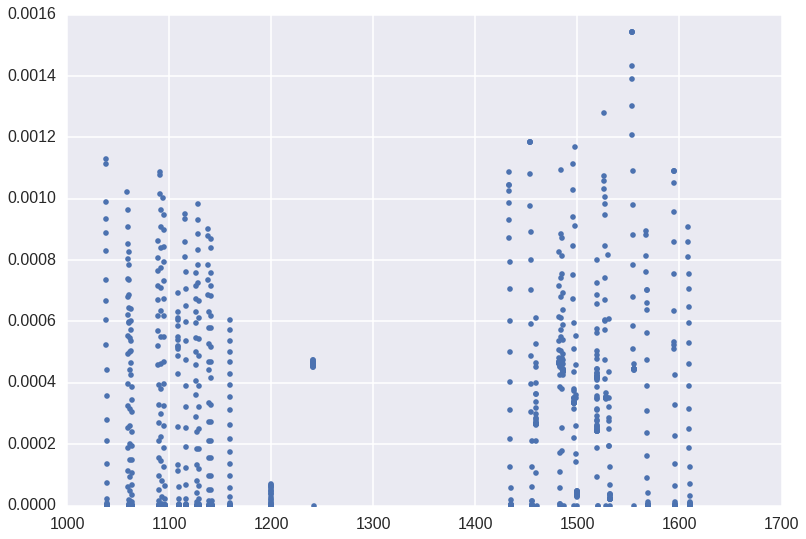

In [75]:
plot(dd.f_0,dd.frac_f0,'.')

/data/home/gjones/anaconda/envs/readout/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


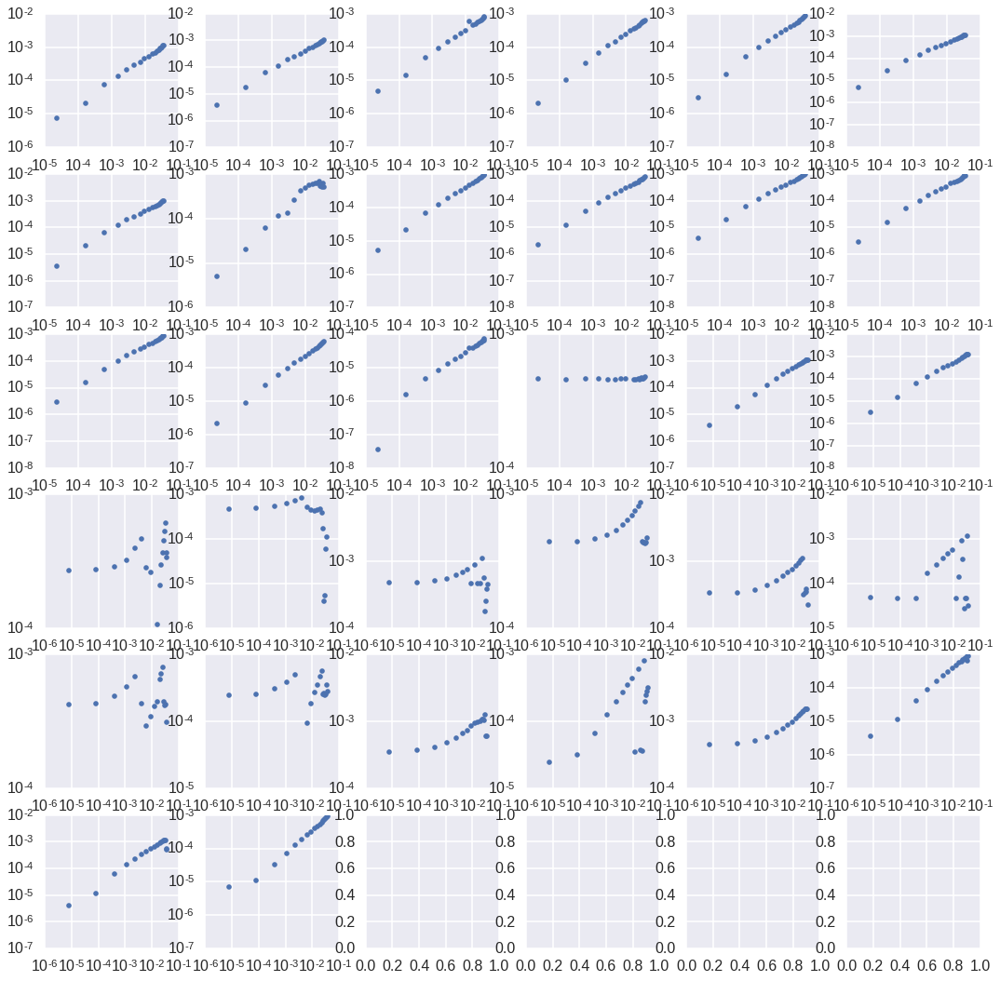

In [80]:
fig,axs = subplots(6,6,figsize=(18,18))
for k in range(32):
    ax = axs.flatten()[k]
    dd = df[(df.timestream_modulation_duty_cycle==0) & (df.resonator_id==k)]
    dd.sort_values(['f_0'],inplace=True)
    ax.loglog(dd.zbd_voltage,dd.frac_f0,'.')

/data/home/gjones/anaconda/envs/readout/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


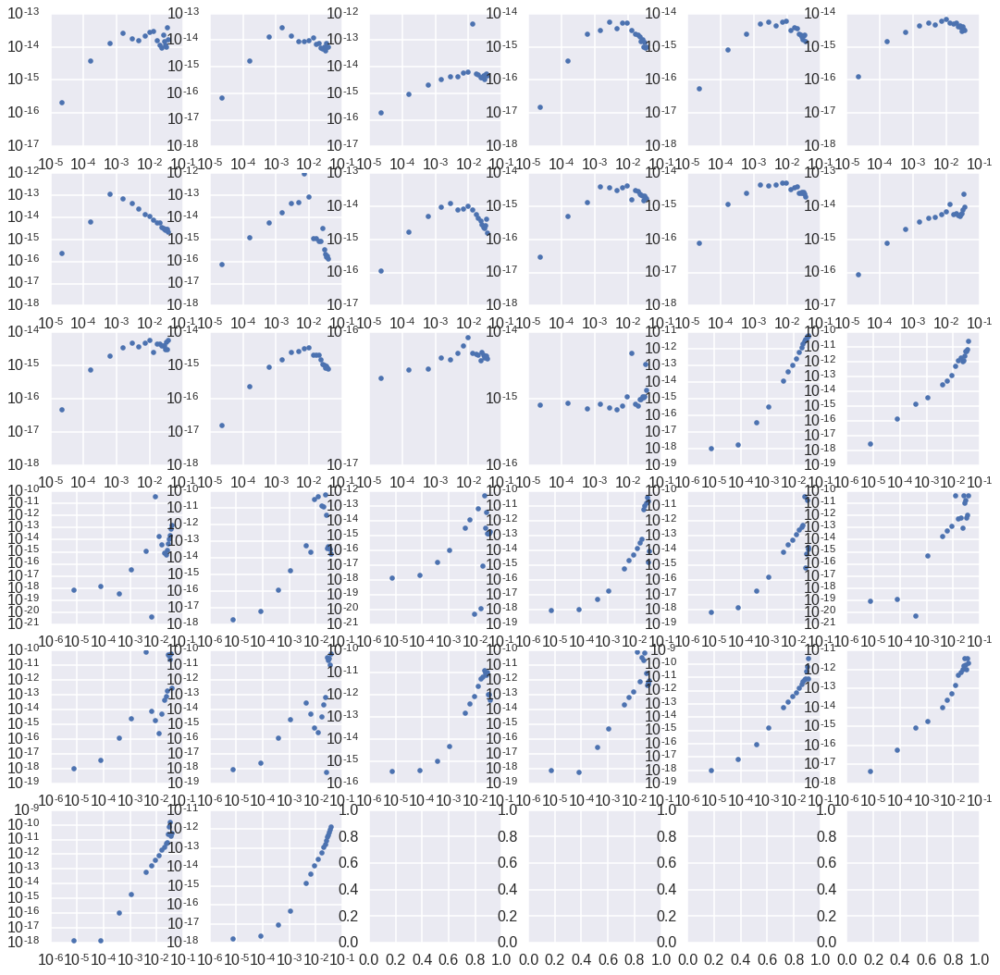

In [81]:
fig,axs = subplots(6,6,figsize=(18,18))
for k in range(32):
    ax = axs.flatten()[k]
    dd = df[(df.timestream_modulation_duty_cycle==0) & (df.resonator_id==k)]
    dd.sort_values(['f_0'],inplace=True)
    ax.loglog(dd.zbd_voltage,dd.device_noise,'.')

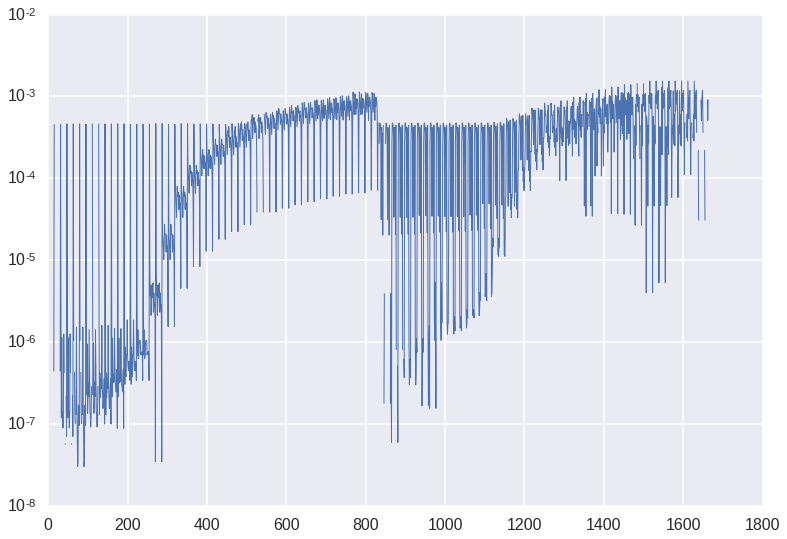

In [17]:
semilogy(df.frac_f0)

In [18]:
df.timestream_modulation_duty_cycle.value_counts()

0.5    832
0.0    832
Name: timestream_modulation_duty_cycle, dtype: int64

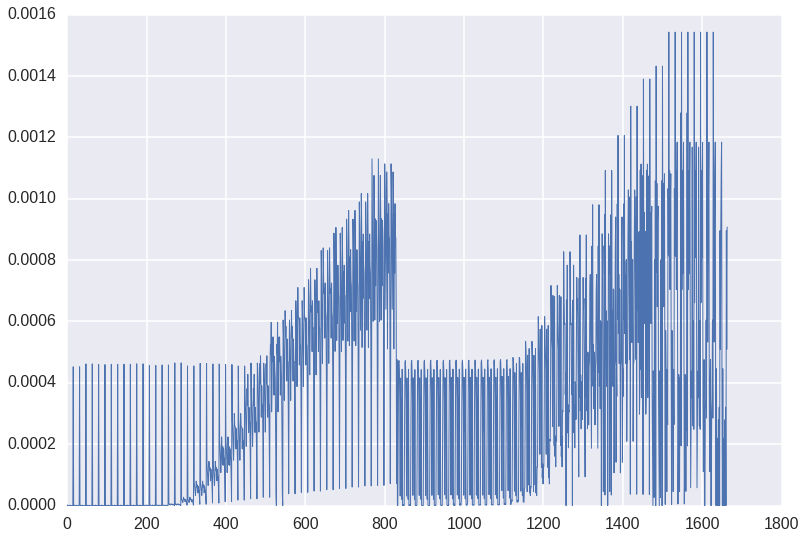

In [10]:
plot(df.frac_f0)

1.279438544 1038.9498798 10777.3493422 nan 0.187376753016 0.0
1.279438544 1038.9498798 10777.3493422 nan 0.187376753016 0.0
1.29332350421 1038.94789244 10820.5811791 nan 0.187032265784 0.0
1.29332350421 1038.94789244 10820.5811791 nan 0.187032265784 0.0
1.30675623959 1038.94879748 10941.8742711 nan 0.18699576504 0.0
1.30675623959 1038.94879748 10941.8742711 nan 0.18699576504 0.0
1.31948098605 1038.94790779 11026.61589 nan 0.18608079333 0.0
1.31948098605 1038.94790779 11026.61589 nan 0.18608079333 0.0
1.33406177559 1038.94818746 10577.0312098 nan 0.186151654911 0.0
1.33406177559 1038.94818746 10577.0312098 nan 0.186151654911 0.0
1.34701302956 1038.94838049 11018.4019659 nan 0.185672030468 0.0
1.34701302956 1038.94838049 11018.4019659 nan 0.185672030468 0.0
1.36320385913 1038.94840643 10977.3314748 nan 0.186094425613 0.0
1.36320385913 1038.94840643 10977.3314748 nan 0.186094425613 0.0
1.37719116237 1038.94822631 10991.5614147 nan 0.186013531763 0.0
1.37719116237 1038.94822631 10991.56141

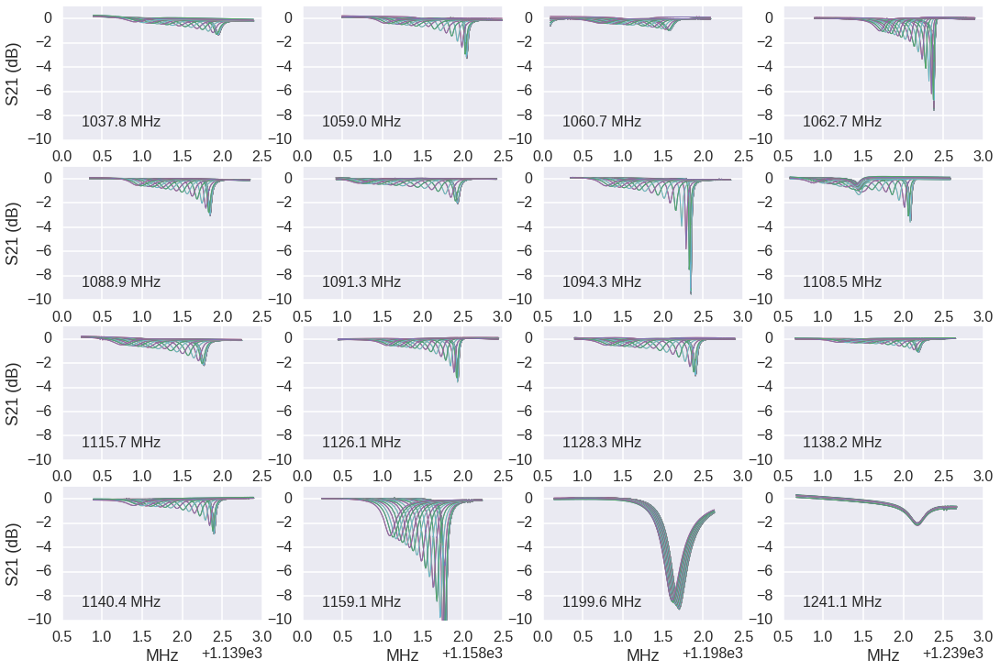

In [9]:
dd = df[#(df.atten==2.0)# & (df.timestream_modulation_duty_cycle==0) 
         (df.f_0 < 1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.plot(row.sweep_freqs_MHz,20*np.log10(np.abs(row.sweep_s21/row.A_mag)))
        if k==0:
            print row.sweep_primary_load_temperature,row.f_0,row.Q_i,row.a,row.sweep_primary_package_temperature,row.zbd_voltage
    #ax.set_xlim(row.sweep_freqs_MHz.mean()-0.2,row.sweep_freqs_MHz.mean()+0.1)
    ax.set_ylim(-10,1)
    ax.text(0.1,0.1,('%.1f MHz' % row.f_0),transform=ax.transAxes)
for k in range(4):
    axs[k,0].set_ylabel('S21 (dB)')
    axs[-1,k].set_xlabel('MHz')
#plt.savefig(plot_dir + ('blackbody-s21-sweeps-group1.png'),bbox_inches='tight')

1.69750909726 1434.55639186 96602.6866304 0.740070979851 0.189034594531 0.0
1.69750909726 1434.55639186 96602.6866304 0.740070979851 0.189034594531 0.0
1.71980455722 1434.55566475 99721.0174932 0.761302418774 0.189316418843 0.0
1.71980455722 1434.55566475 99721.0174932 0.761302418774 0.189316418843 0.0
1.74251149788 1434.55550565 98673.7975454 0.755357735388 0.189477132442 0.0
1.74251149788 1434.55550565 98673.7975454 0.755357735388 0.189477132442 0.0
1.76585698112 1434.55481566 100183.424997 0.752580749237 0.189794967636 0.0
1.76585698112 1434.55481566 100183.424997 0.752580749237 0.189794967636 0.0
1.79035825974 1434.55414284 99389.2087757 0.74534709873 0.190050590396 0.0
1.79035825974 1434.55414284 99389.2087757 0.74534709873 0.190050590396 0.0
1.81390072934 1434.55392801 97512.4896124 0.728772303541 0.19112463534 0.0
1.81390072934 1434.55392801 97512.4896124 0.728772303541 0.19112463534 0.0
1.83753863558 1434.55347472 95491.91759 0.708609280928 0.190799246838 0.0
1.83753863558 1434

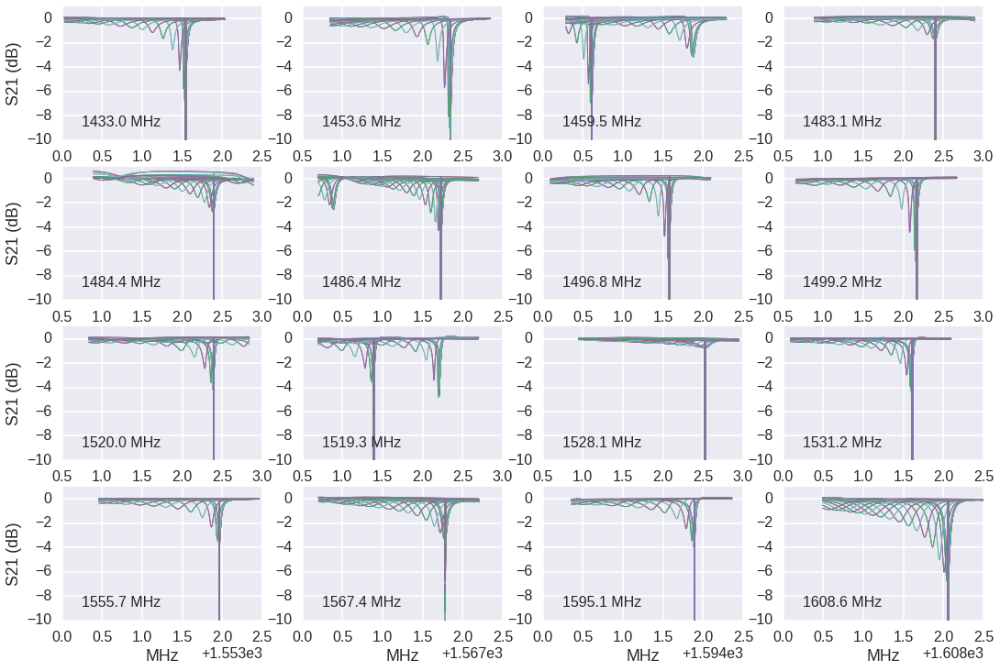

In [50]:
dd = df[#(df.atten==2.0)# & (df.timestream_modulation_duty_cycle==0) 
         (df.f_0 > 1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.plot(row.sweep_freqs_MHz,20*np.log10(np.abs(row.sweep_s21/row.A_mag)))
        if k==0:
            print row.sweep_primary_load_temperature,row.f_0,row.Q_i,row.a,row.sweep_primary_package_temperature,row.zbd_voltage
    #ax.set_xlim(row.sweep_freqs_MHz.mean()-0.2,row.sweep_freqs_MHz.mean()+0.1)
    ax.set_ylim(-10,1)
    ax.text(0.1,0.1,('%.1f MHz' % row.f_0),transform=ax.transAxes)
for k in range(4):
    axs[k,0].set_ylabel('S21 (dB)')
    axs[-1,k].set_xlabel('MHz')
#plt.savefig(plot_dir + ('blackbody-s21-sweeps-group1.png'),bbox_inches='tight')

1.279438544 1038.9498798 10777.3493422 nan 0.187376753016 0.0
1.279438544 1038.9498798 10777.3493422 nan 0.187376753016 0.0
1.29332350421 1038.94789244 10820.5811791 nan 0.187032265784 0.0
1.29332350421 1038.94789244 10820.5811791 nan 0.187032265784 0.0
1.30675623959 1038.94879748 10941.8742711 nan 0.18699576504 0.0
1.30675623959 1038.94879748 10941.8742711 nan 0.18699576504 0.0
1.31948098605 1038.94790779 11026.61589 nan 0.18608079333 0.0
1.31948098605 1038.94790779 11026.61589 nan 0.18608079333 0.0
1.33406177559 1038.94818746 10577.0312098 nan 0.186151654911 0.0
1.33406177559 1038.94818746 10577.0312098 nan 0.186151654911 0.0
1.34701302956 1038.94838049 11018.4019659 nan 0.185672030468 0.0
1.34701302956 1038.94838049 11018.4019659 nan 0.185672030468 0.0
1.36320385913 1038.94840643 10977.3314748 nan 0.186094425613 0.0
1.36320385913 1038.94840643 10977.3314748 nan 0.186094425613 0.0
1.37719116237 1038.94822631 10991.5614147 nan 0.186013531763 0.0
1.37719116237 1038.94822631 10991.56141

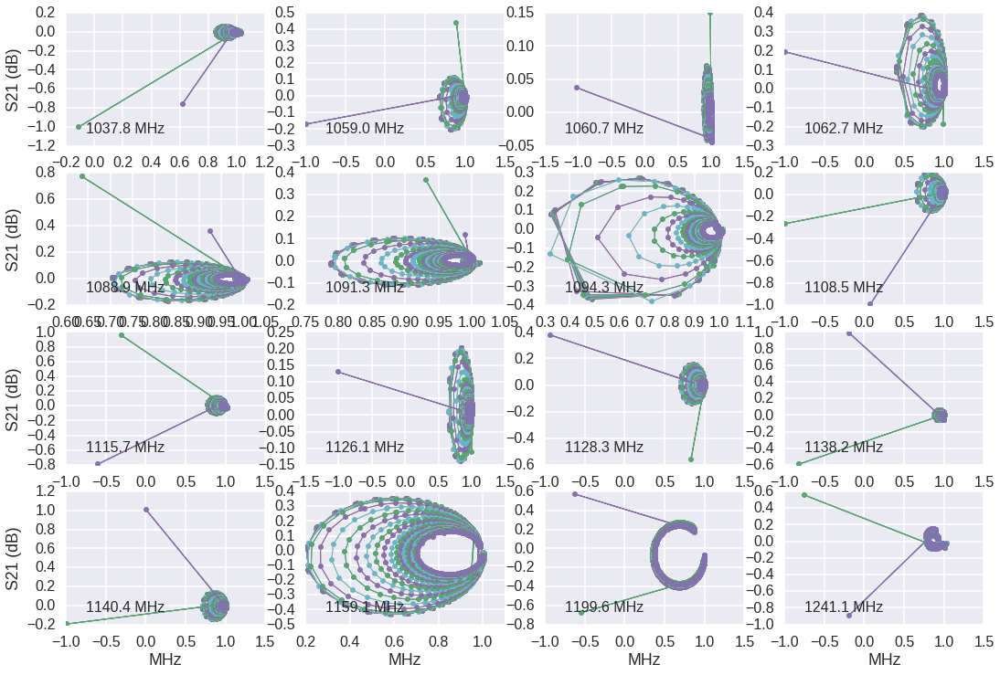

In [10]:
dd = df[(df.atten<=2.0)# & (df.timestream_modulation_duty_cycle==0) 
        & (df.f_0 < 1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        #ax.plot(row.sweep_freqs_MHz,20*np.log10(np.abs(row.sweep_s21/row.A_mag)))
        ax.plot(row.sweep_normalized_s21.real,row.sweep_normalized_s21.imag,'.-')
        if k==0:
            print row.sweep_primary_load_temperature,row.f_0,row.Q_i,row.a,row.sweep_primary_package_temperature,row.zbd_voltage
    #ax.set_xlim(row.sweep_freqs_MHz.mean()-0.2,row.sweep_freqs_MHz.mean()+0.1)
    ax.text(0.1,0.1,('%.1f MHz' % row.f_0),transform=ax.transAxes)
for k in range(4):
    axs[k,0].set_ylabel('S21 (dB)')
    axs[-1,k].set_xlabel('MHz')
#plt.savefig(plot_dir + ('blackbody-s21-sweeps-group1.png'),bbox_inches='tight')

1.69750909726 1434.55639186 96602.6866304 0.740070979851 0.189034594531 0.0
1.69750909726 1434.55639186 96602.6866304 0.740070979851 0.189034594531 0.0
1.71980455722 1434.55566475 99721.0174932 0.761302418774 0.189316418843 0.0
1.71980455722 1434.55566475 99721.0174932 0.761302418774 0.189316418843 0.0
1.74251149788 1434.55550565 98673.7975454 0.755357735388 0.189477132442 0.0
1.74251149788 1434.55550565 98673.7975454 0.755357735388 0.189477132442 0.0
1.76585698112 1434.55481566 100183.424997 0.752580749237 0.189794967636 0.0
1.76585698112 1434.55481566 100183.424997 0.752580749237 0.189794967636 0.0
1.79035825974 1434.55414284 99389.2087757 0.74534709873 0.190050590396 0.0
1.79035825974 1434.55414284 99389.2087757 0.74534709873 0.190050590396 0.0
1.81390072934 1434.55392801 97512.4896124 0.728772303541 0.19112463534 0.0
1.81390072934 1434.55392801 97512.4896124 0.728772303541 0.19112463534 0.0
1.83753863558 1434.55347472 95491.91759 0.708609280928 0.190799246838 0.0
1.83753863558 1434

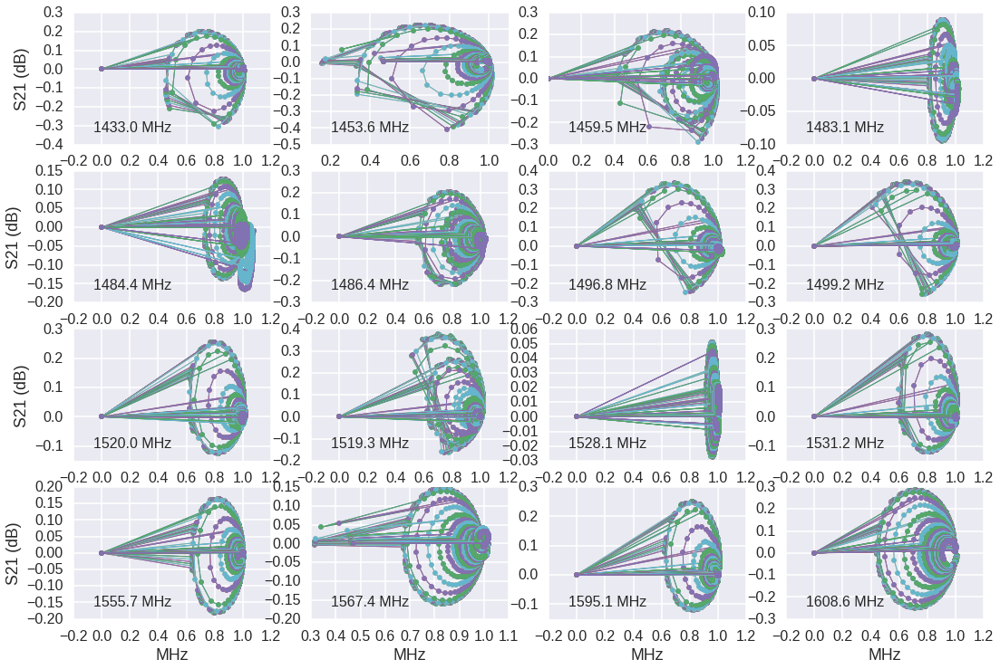

In [51]:
dd = df[(df.atten<=2.0)# & (df.timestream_modulation_duty_cycle==0) 
        & (df.f_0 > 1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        #ax.plot(row.sweep_freqs_MHz,20*np.log10(np.abs(row.sweep_s21/row.A_mag)))
        ax.plot(row.sweep_normalized_s21.real,row.sweep_normalized_s21.imag,'.-')
        if k==0:
            print row.sweep_primary_load_temperature,row.f_0,row.Q_i,row.a,row.sweep_primary_package_temperature,row.zbd_voltage
    #ax.set_xlim(row.sweep_freqs_MHz.mean()-0.2,row.sweep_freqs_MHz.mean()+0.1)
    ax.text(0.1,0.1,('%.1f MHz' % row.f_0),transform=ax.transAxes)
for k in range(4):
    axs[k,0].set_ylabel('S21 (dB)')
    axs[-1,k].set_xlabel('MHz')
#plt.savefig(plot_dir + ('blackbody-s21-sweeps-group1.png'),bbox_inches='tight')

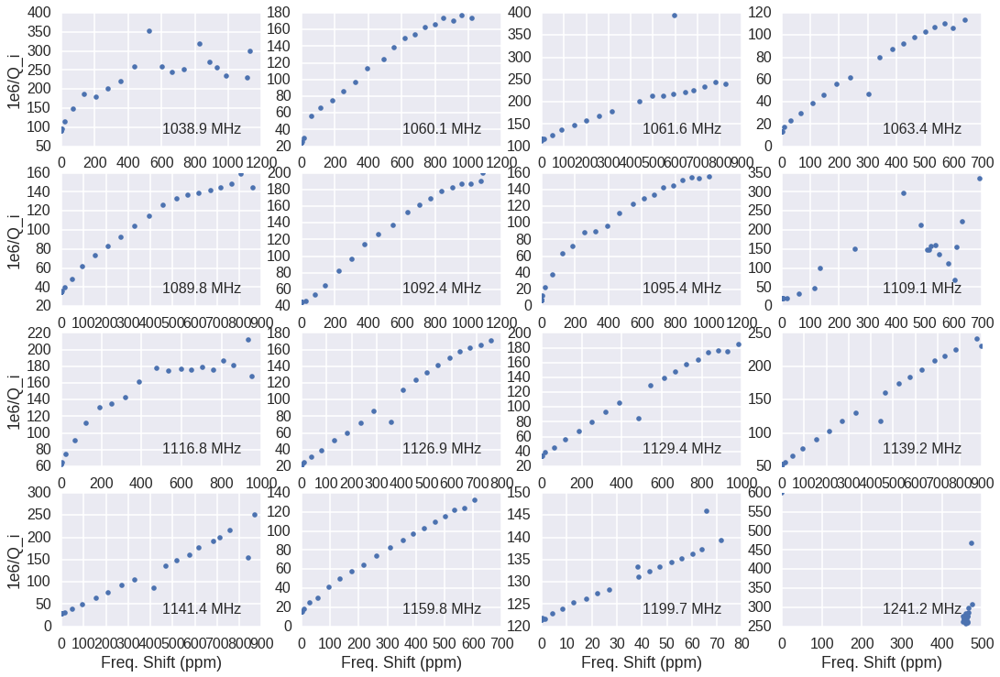

In [11]:
dd = df[(df.atten<=2.0) & (df.timestream_modulation_duty_cycle!=0.5) & (df.f_0 <1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    x = res.frac_f0 #1-res.f_0/res.f_0.max()
    ax.plot(1e6*x,1e6/res.Q_i,'.')
    #ax.set_xlim(-10,100)
    #ax.set_ylim(0,40)
    ax.text(0.9,0.1,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
#    ax.plot(res.sweep_primary_package_temperature,1e6/res.Q_i,'.')
for k in range(4):
    axs[-1,k].set_xlabel('Freq. Shift (ppm)')
    axs[k,0].set_ylabel('1e6/Q_i')
#plt.savefig(plot_dir + ('iQi_vs_x.png'),bbox_inches='tight')

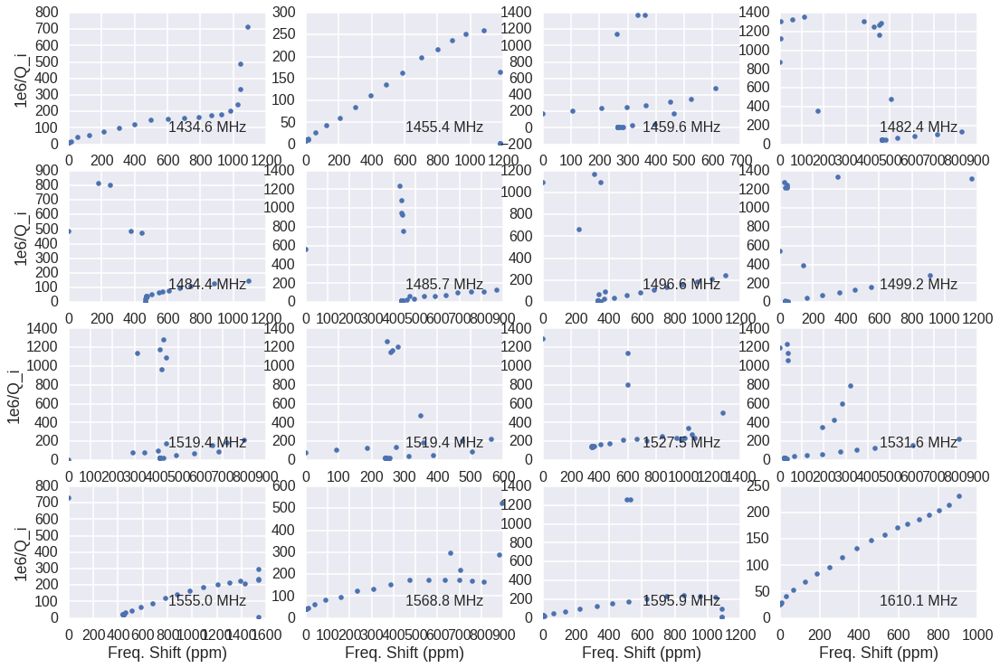

In [54]:
dd = df[(df.atten<=2.0) & (df.timestream_modulation_duty_cycle!=0.5) & (df.f_0 >1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    x = 1-res.f_0/res.f_0.max()
    ax.plot(1e6*x,1e6/res.Q_i,'.')
    #ax.set_xlim(-10,100)
    #ax.set_ylim(0,40)
    ax.text(0.9,0.1,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
#    ax.plot(res.sweep_primary_package_temperature,1e6/res.Q_i,'.')
for k in range(4):
    axs[-1,k].set_xlabel('Freq. Shift (ppm)')
    axs[k,0].set_ylabel('1e6/Q_i')
#plt.savefig(plot_dir + ('iQi_vs_x.png'),bbox_inches='tight')

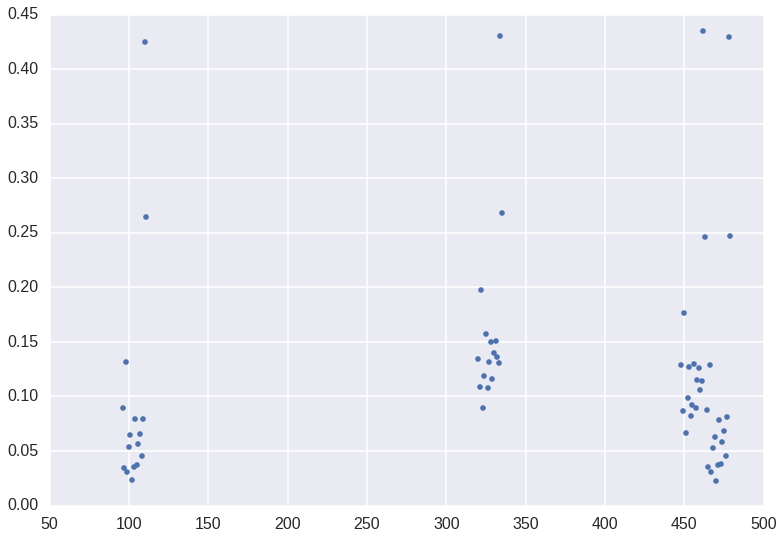

In [18]:
500/662.

0.7552870090634441

IndexError: single positional indexer is out-of-bounds

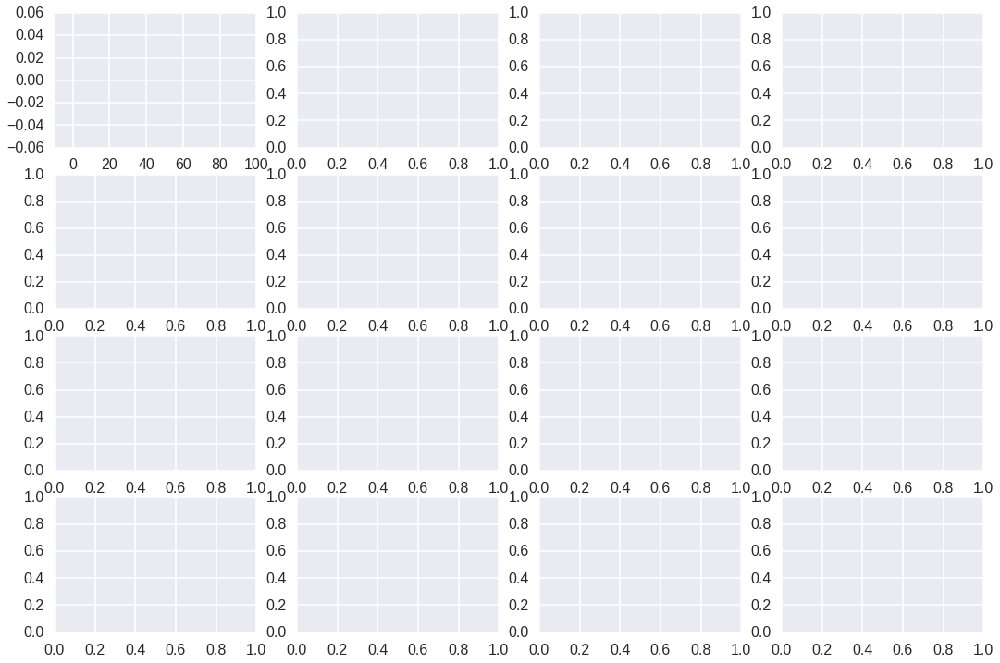

In [13]:
dd = df[(df.atten==20.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 >1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    x = 1-res.f_0/res.f_0.max()
    ax.plot(1e6*x,1e6/res.Q_i,'.')
    ax.set_xlim(-10,100)
    #ax.set_ylim(0,40)
    ax.text(0.9,0.1,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
#    ax.plot(res.sweep_primary_package_temperature,1e6/res.Q_i,'.')
for k in range(4):
    axs[-1,k].set_xlabel('Freq. Shift (ppm)')
    axs[k,0].set_ylabel('1e6/Q_i')

1.26736226145 1434.56357776 59406.7662265 nan 0.167691768145
2.0812118543 1434.55302925 52370.0891174 nan 0.170720055823
2.50896423502 1434.54212786 46684.4341975 nan 0.180427814946
2.99766520172 1434.52742008 40907.9238487 nan 0.191209790194
4.02244780104 1434.48835047 30420.1516379 nan 0.195226058188
4.49351961824 1434.4718462 28505.9368077 nan 0.227583790385
5.00232063251 1434.44802696 25573.799936 nan 0.244329343817
5.49098114725 1434.42177888 23366.1039359 nan 0.268253327702
5.9984101468 1434.3997463 21126.1989239 nan 0.264038769901
6.49391958539 1434.37040741 19313.7876489 nan 0.278532636478
1.4968367068 1434.52794677 44425.2771358 nan 0.281738988829
1.68712205955 1434.54779344 52180.9037535 nan 0.244647530268
1.97183981134 1434.44125797 26756.0247846 nan 0.316589820951


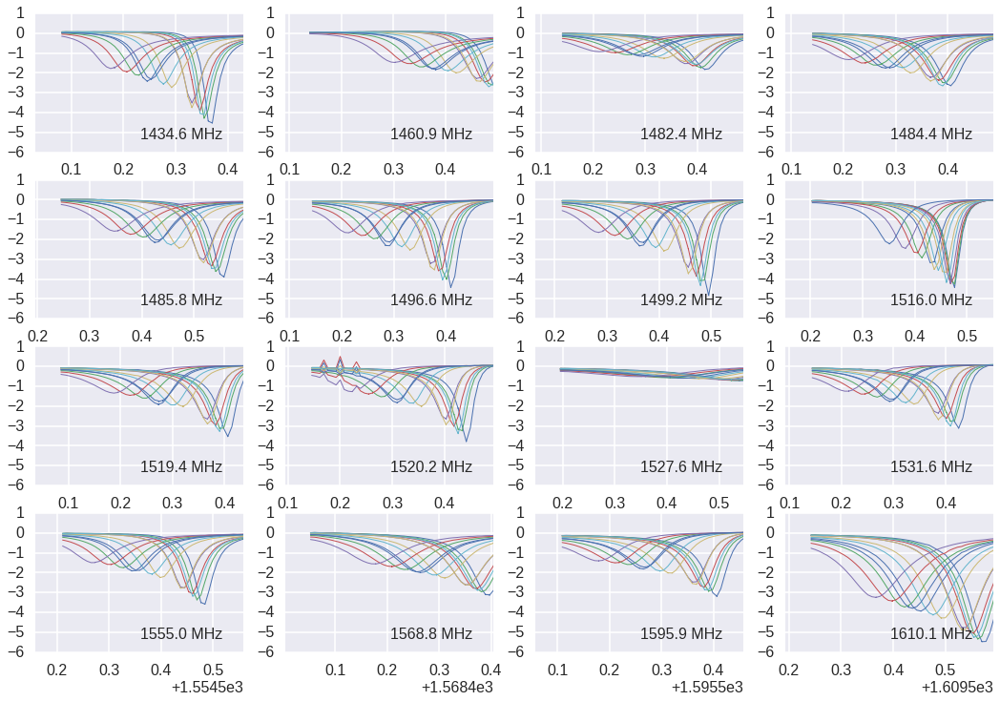

In [12]:
dd = df[(df.atten==20.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 > 1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.plot(row.sweep_freqs_MHz,20*np.log10(np.abs(row.sweep_s21/row.A_mag)))
        if k==0:
            print row.sweep_primary_load_temperature,row.f_0,row.Q_i,row.a,row.sweep_primary_package_temperature
    ax.set_xlim(row.sweep_freqs_MHz.mean()-0.3,row.sweep_freqs_MHz.mean()+0.1)
    ax.xaxis.set_major_locator(plt.MaxNLocator(4))
    ax.text(0.9,0.1,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    ax.set_ylim(-6,1)

1.24066876864 1038.95334005 14170.7508305 nan 0.170788699102
2.09742303134 1038.94586352 13816.596421 nan 0.170153839729
2.58481055837 1038.93866621 13413.9112897 nan 0.178635731292
2.99285919035 1038.92914614 13018.9263532 nan 0.188588330828
4.67275709846 1038.90349485 11788.80341 nan 0.18855046791
4.49521078165 1038.89503743 11573.0745143 nan 0.217691495074
4.99701496618 1038.88018998 11163.0300961 nan 0.239046390804
5.48328114016 1038.87010002 10867.1866331 nan 0.252334091026
5.98493403167 1038.85162338 10246.9174824 nan 0.258147618916
6.49726122586 1038.83511651 9781.11567606 nan 0.270632416449
1.4587734257 1038.92864091 11660.5497699 nan 0.281732892978
1.64586754721 1038.94201899 12584.3839685 nan 0.244407348984
1.9266432575 1038.87499485 9975.80516729 nan 0.316104284533


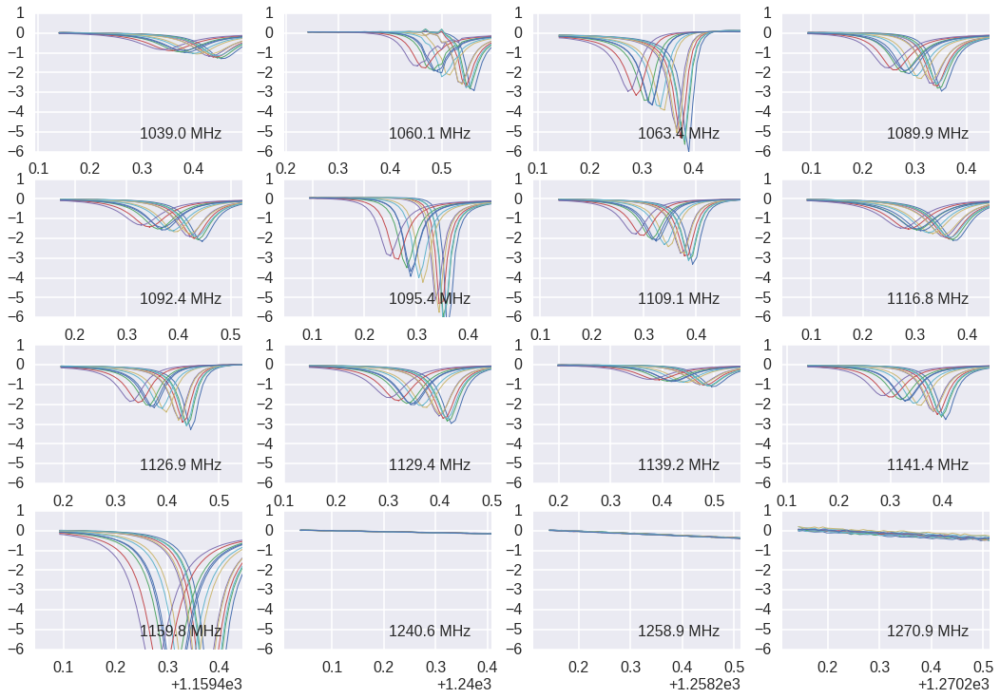

In [13]:
dd = df[(df.atten==20.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 < 1300)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.plot(row.sweep_freqs_MHz,20*np.log10(np.abs(row.sweep_s21/row.A_mag)))
        if k==0:
            print row.sweep_primary_load_temperature,row.f_0,row.Q_i,row.a,row.sweep_primary_package_temperature
    ax.set_xlim(row.sweep_freqs_MHz.mean()-0.3,row.sweep_freqs_MHz.mean()+0.1)
    ax.xaxis.set_major_locator(plt.MaxNLocator(4))
    ax.text(0.9,0.1,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    ax.set_ylim(-6,1)

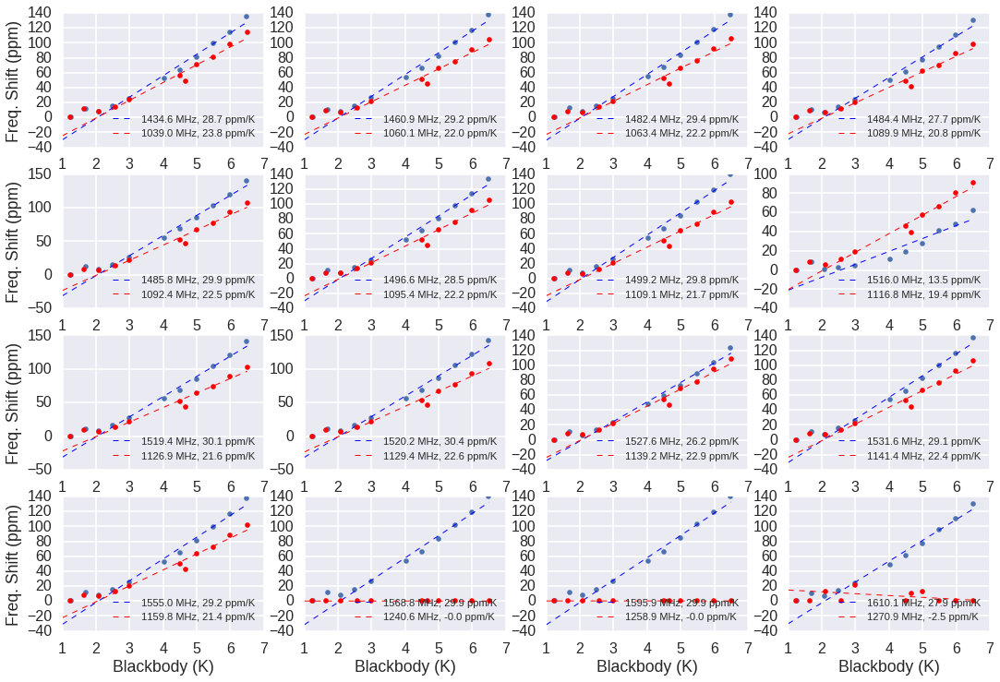

In [34]:
dd = df[(df.atten==20.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 > 1300) & (df.sweep_primary_package_temperature < 0.28)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    Tbb = res.sweep_primary_load_temperature
    xppm = 1e6*(1-res.f_0/res.f_0.max())
    ax.plot(Tbb,xppm,'.',label='')
    mask = (Tbb > 2)# & (xppm < 10)
    if mask.sum():
        pp = np.polyfit(Tbb[mask],xppm[mask],1)
        T = np.linspace(1,6.5,10)
        ax.plot(T,np.polyval(pp,T),'b--',label=('%.1f MHz, %.1f ppm/K' % (res.f_0.iloc[0],pp[0])))

    #ax.set_ylim(0,10)
dd = df[(df.atten==20.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 < 1300) & (df.sweep_primary_package_temperature < 0.28)]
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    Tbb = res.sweep_primary_load_temperature
    xppm = 1e6*(1-res.f_0/res.f_0.max())
    ax.plot(Tbb,xppm,'r.',label='')
    mask = (Tbb > 2)# & (xppm < 10)
    if mask.sum():
        pp = np.polyfit(Tbb[mask],xppm[mask],1)
        T = np.linspace(1,6.5,10)
        ax.plot(T,np.polyval(pp,T),'r--',label=('%.1f MHz, %.1f ppm/K' % (res.f_0.iloc[0],pp[0])))
    ax.legend(loc='lower right',prop=dict(size='x-small'))

for k in range(4):
    axs[-1,k].set_xlabel('Blackbody (K)')
    axs[k,0].set_ylabel('Freq. Shift (ppm)')
plt.savefig(plot_dir + ('blackbody-response.png'),bbox_inches='tight')

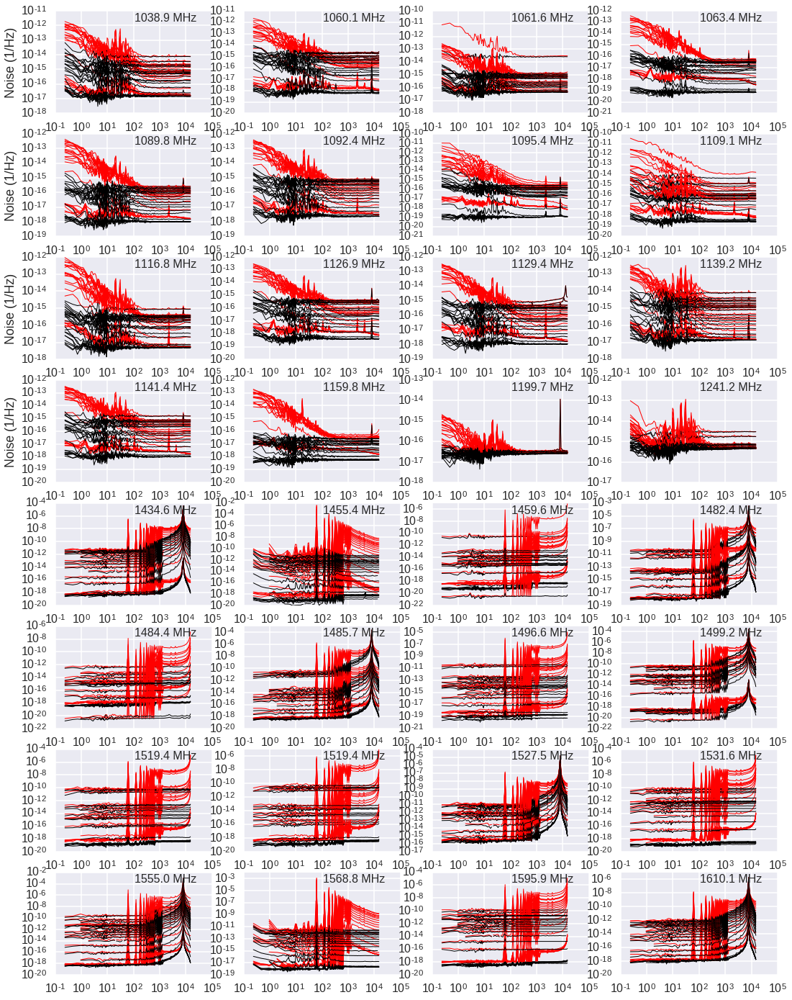

In [82]:
dd = df[(df.atten<=2.0) & (df.timestream_modulation_duty_cycle!=0.5)   # &(df.sweep_primary_package_temperature<.2) &
       ]#(df.sweep_primary_load_temperature<2)]
fig,axs = subplots(8,4,figsize=(18,24))
for k in range(32):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.loglog(row.pca_freq,row.pca_eigvals[1,:],'r')
        ax.loglog(row.pca_freq,row.pca_eigvals[0,:],'k')
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    
for k in range(4):
    axs[k,0].set_ylabel('Noise (1/Hz)')
#plt.savefig(plot_dir + ('raw_noise_group_2.png'),bbox_inches='tight')

In [42]:
pcas = np.vstack(dd.pca_eigvals.values)

In [24]:
pcas.shape

(52, 147)

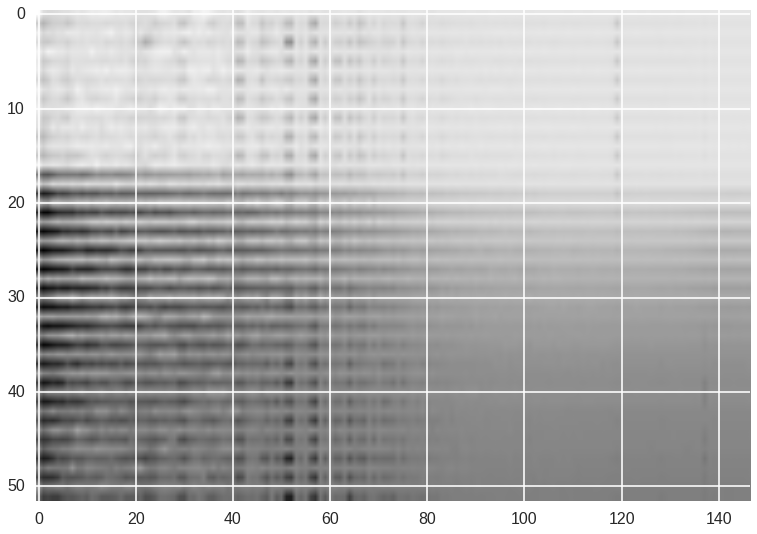

In [43]:
imshow(np.log10(pcas),aspect='auto')

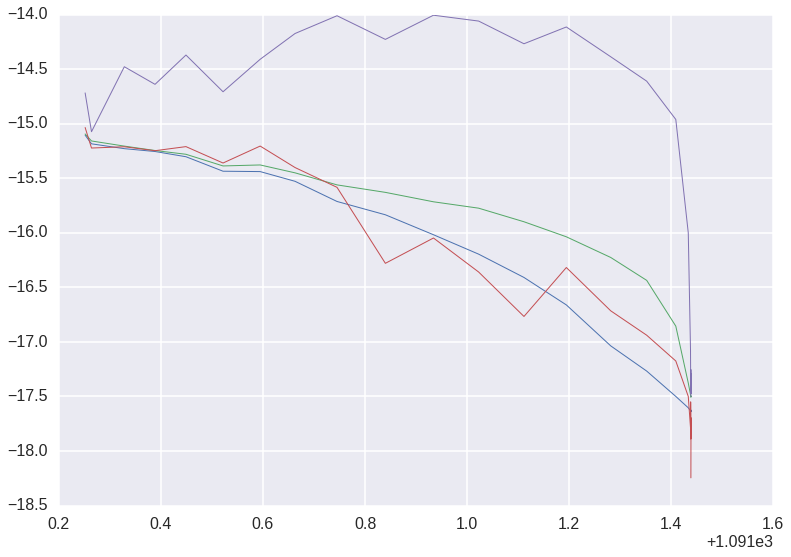

In [49]:
plot(dd2.f_0,np.log10(pcas[0::2,140]))
plot(dd2.f_0,np.log10(pcas[1::2,140]))
plot(dd2.f_0,np.log10(pcas[0::2,34]))
plot(dd2.f_0,np.log10(pcas[1::2,34]))


In [38]:
dd = df[(df.f_0<1300) & (df.resonator_id==5) & (df.timestream_modulation_duty_cycle==0)]
dd2 = df[(df.f_0<1300) & (df.resonator_id==5) & (df.timestream_modulation_duty_cycle==0.5)]


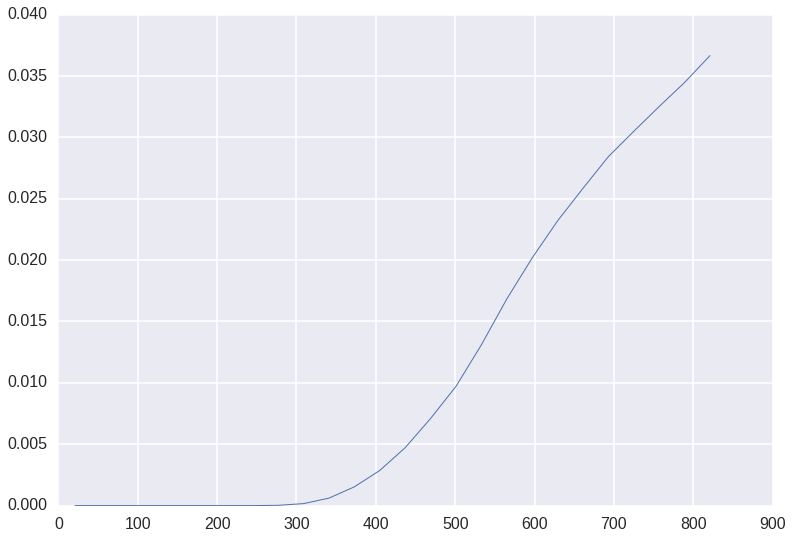

In [39]:
plot(dd2.zbd_voltage)
#plot('symlog')

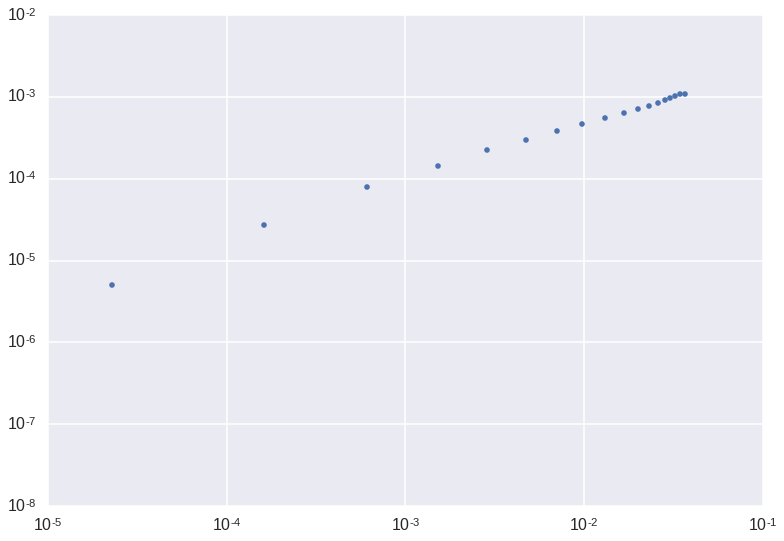

In [40]:
loglog(dd2.zbd_voltage,1-dd.f_0/dd.f_0.max(),'.')

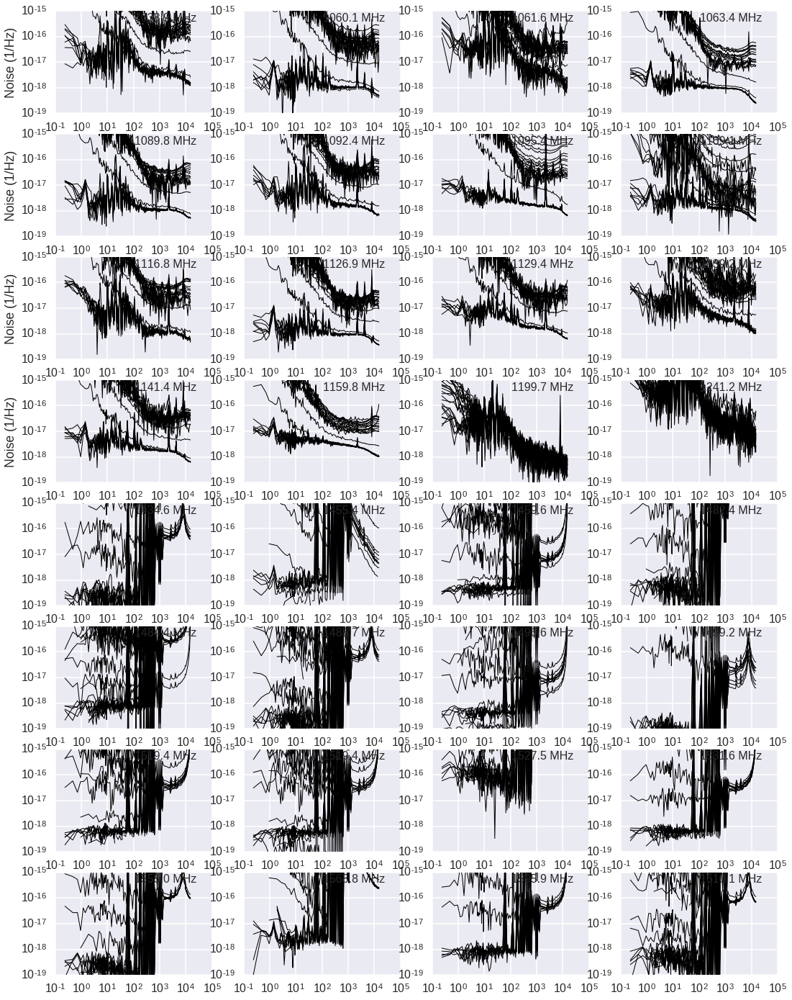

In [83]:
dd = df[(df.atten<=2.0) & (df.timestream_modulation_duty_cycle!=0.5) #& (df.f_0 < 1300)  # &(df.sweep_primary_package_temperature<.2) &
       ]#(df.sweep_primary_load_temperature<2)]
fig,axs = subplots(8,4,figsize=(18,24))
for k in range(32):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.loglog(row.pca_freq,row.pca_eigvals[1,:]-row.pca_eigvals[0,:],'k')
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    ax.set_ylim(1e-19,1e-15)
for k in range(4):
    axs[k,0].set_ylabel('Noise (1/Hz)')
#plt.savefig(plot_dir + ('raw_noise_group_2.png'),bbox_inches='tight')

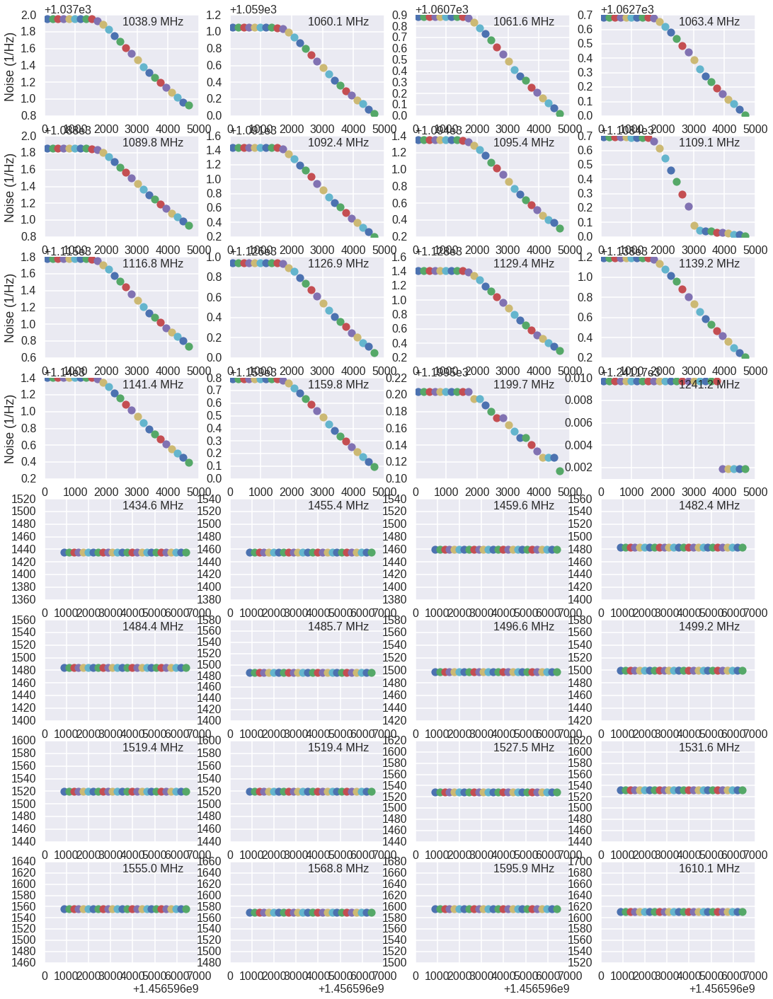

In [87]:
dd = df[(df.atten<=2.0) & (df.timestream_modulation_duty_cycle!=0.5) #& (df.f_0 < 1300)  # &(df.sweep_primary_package_temperature<.2) &
       ]#(df.sweep_primary_load_temperature<2)]
fig,axs = subplots(8,4,figsize=(18,24))
for k in range(32):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.plot(row.sweep_epoch,row.sweep_freqs_MHz[np.abs(row.sweep_s21).argmin()],'o')
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
#    ax.set_ylim(1e-19,1e-15)
for k in range(4):
    axs[k,0].set_ylabel('Noise (1/Hz)')
#plt.savefig(plot_dir + ('raw_noise_group_2.png'),bbox_inches='tight')

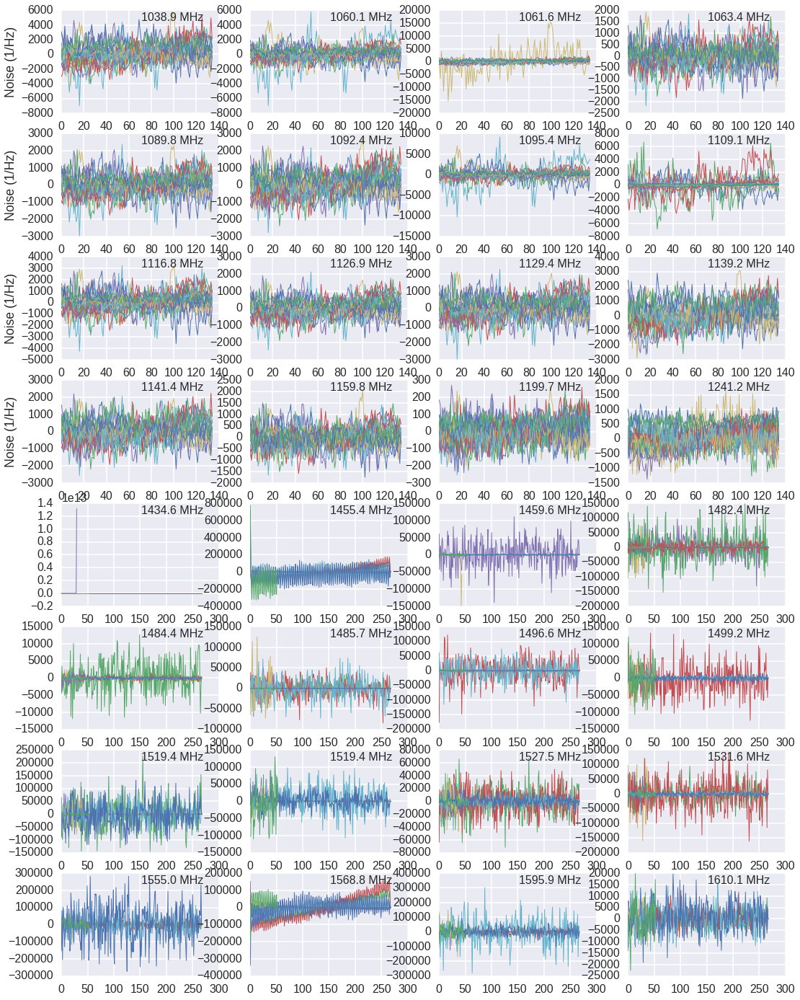

In [86]:
dd = df[(df.atten<=2.0) & (df.timestream_modulation_duty_cycle!=0.5) #& (df.f_0 < 1300)  # &(df.sweep_primary_package_temperature<.2) &
       ]#(df.sweep_primary_load_temperature<2)]
fig,axs = subplots(8,4,figsize=(18,24))
for k in range(32):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.plot(row.low_pass_projected_timeseries.real)
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    #ax.set_ylim(1e-19,1e-15)
for k in range(4):
    axs[k,0].set_ylabel('Noise (1/Hz)')
#plt.savefig(plot_dir + ('raw_noise_group_2.png'),bbox_inches='tight')

In [ ]:
dd = df[(df.atten==0.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 < 1300) & (df.sweep_primary_package_temperature<.2) &
       (df.sweep_primary_load_temperature<2)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.loglog(row.pca_freq,row.pca_eigvals[1,:],'r')
        ax.loglog(row.pca_freq,row.pca_eigvals[0,:],'k')
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    
for k in range(4):
    axs[k,0].set_ylabel('Noise (1/Hz)')
plt.savefig(plot_dir + ('raw_noise_group_1.png'),bbox_inches='tight')

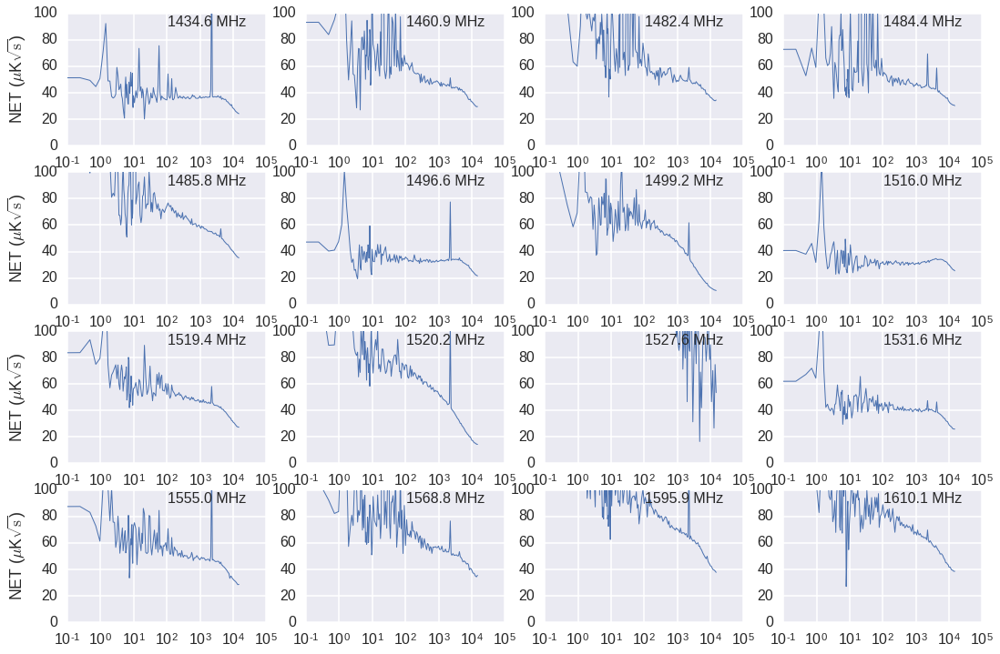

In [37]:
dd = df[(df.atten==2.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 > 1300) & (df.sweep_primary_package_temperature<.2) &
       (df.sweep_primary_load_temperature<2)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        per_rt_hz = np.sqrt(row.pca_eigvals[1,:]-row.pca_eigvals[0,:])
        net = per_rt_hz/(25e-6)/np.sqrt(2) # 2ppm/K
        ax.loglog(row.pca_freq,net*1e6)
#        ax.loglog(row.pca_freq,row.pca_eigvals[0,:])
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    ax.set_xscale('log')
    ax.set_yscale('linear')
    ax.set_ylim(0,100)
        
for k in range(4):
    axs[k,0].set_ylabel('NET ($\mu$K$\sqrt{\mathrm{s}}$)')
plt.savefig(plot_dir + ('NET_assuming_25ppm_per_K_group_2.png'),bbox_inches='tight')

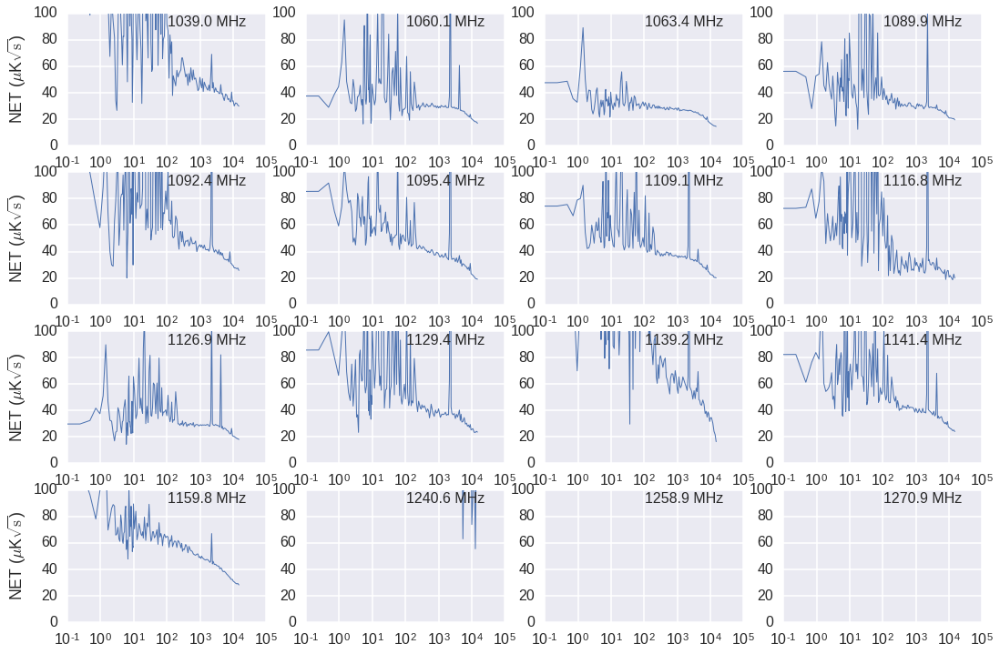

In [38]:
dd = df[(df.atten==2.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 < 1300) & (df.sweep_primary_package_temperature<.2) &
       (df.sweep_primary_load_temperature<2)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        per_rt_hz = np.sqrt(row.pca_eigvals[1,:]-row.pca_eigvals[0,:])
        net = per_rt_hz/(25e-6)/np.sqrt(2) # 2ppm/K
        ax.loglog(row.pca_freq,net*1e6)
#        ax.loglog(row.pca_freq,row.pca_eigvals[0,:])
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    ax.set_xscale('log')
    ax.set_yscale('linear')
    ax.set_ylim(0,100)
        
for k in range(4):
    axs[k,0].set_ylabel('NET ($\mu$K$\sqrt{\mathrm{s}}$)')
plt.savefig(plot_dir + ('NET_assuming_25ppm_per_K_group_1.png'),bbox_inches='tight')    

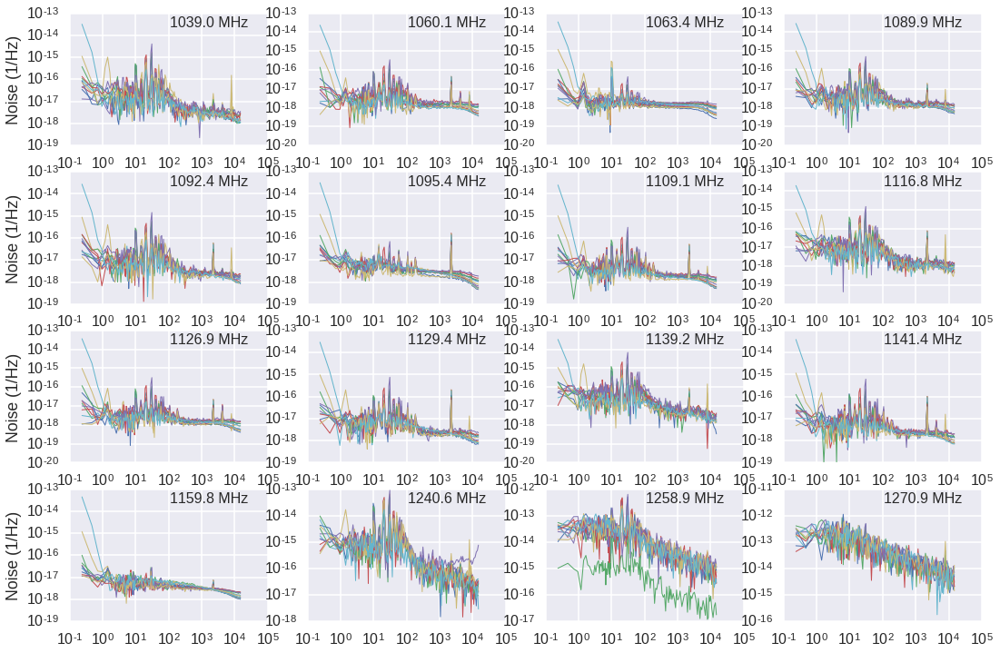

In [24]:
dd = df[(df.atten==2.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 < 1300) & (df.sweep_primary_package_temperature<.27) &
       (df.sweep_primary_load_temperature<20)]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    for m,row in res.iterrows():
        ax.loglog(row.pca_freq,row.pca_eigvals[1,:]-row.pca_eigvals[0,:])#,'r')
        #ax.loglog(row.pca_freq,row.pca_eigvals[0,:],'k')
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    
for k in range(4):
    axs[k,0].set_ylabel('Noise (1/Hz)')

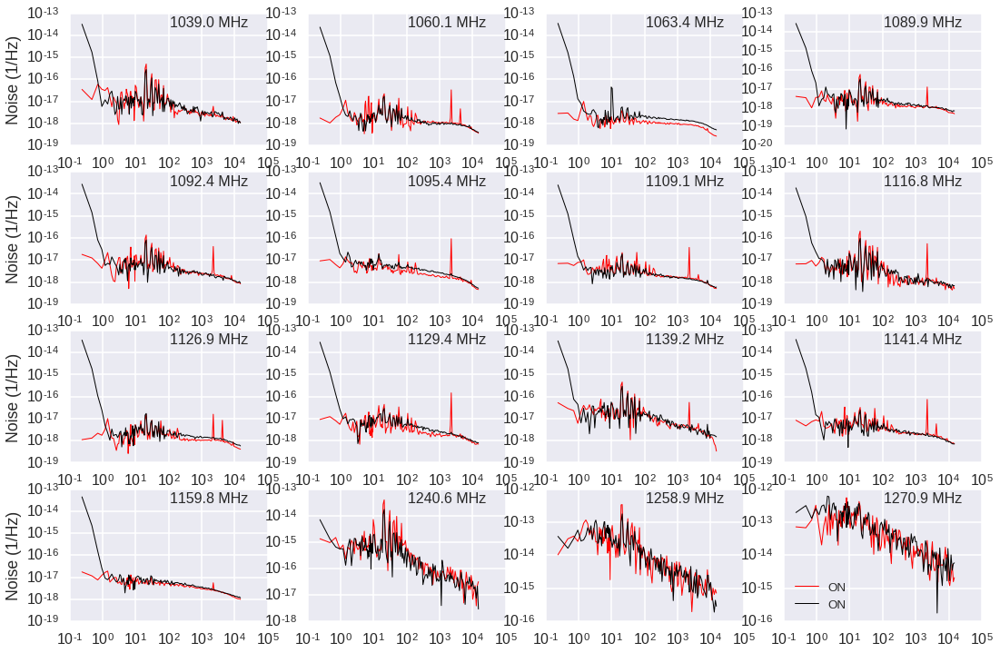

In [39]:
dd = df[(df.atten==2.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 < 1300) & (df.sweep_primary_package_temperature<.27) &
       ((df.sweep_primary_load_temperature<1.5) | (df.sweep_epoch>1456105083))]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    label = 'ON'
    color='r'
    for m,row in res.iterrows():
        ax.loglog(row.pca_freq,row.pca_eigvals[1,:]-row.pca_eigvals[0,:],label='ON',color=color)#,'r')
        label='OFF'
        color='k'
        #ax.loglog(row.pca_freq,row.pca_eigvals[0,:],'k')
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    
for k in range(4):
    axs[k,0].set_ylabel('Noise (1/Hz)')
axs[-1,-1].legend(loc='lower left',prop=dict(size='small'))
plt.savefig(plot_dir + ('compressor_on_off_group_1.png'),bbox_inches='tight')

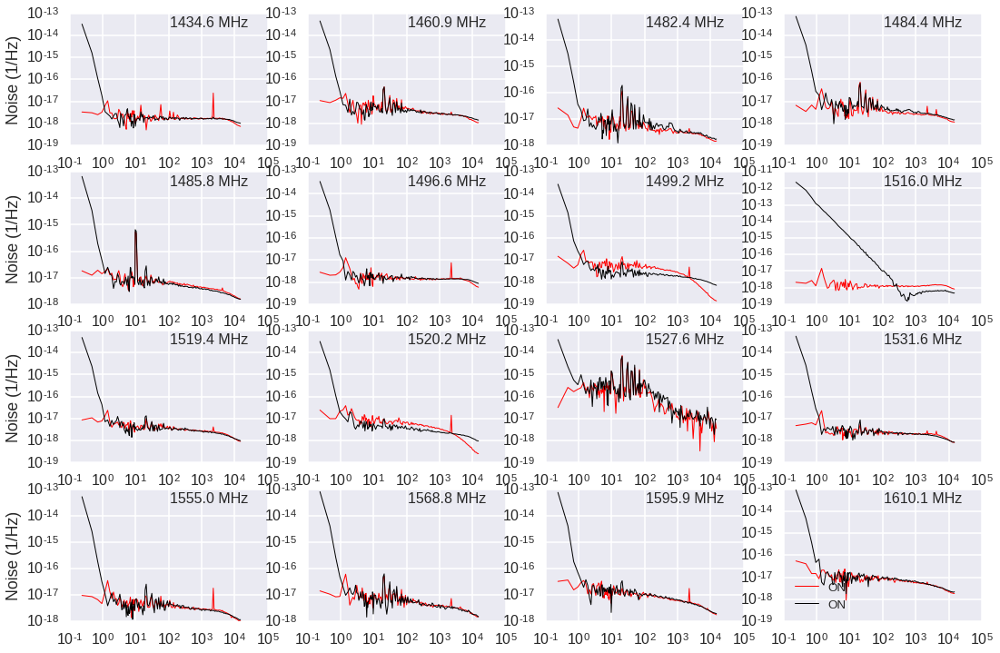

In [40]:
dd = df[(df.atten==2.0) & (df.timestream_modulation_duty_cycle==1) & (df.f_0 > 1300) & (df.sweep_primary_package_temperature<.27) &
       ((df.sweep_primary_load_temperature<1.5) | (df.sweep_epoch>1456105083))]
fig,axs = subplots(4,4,figsize=(18,12))
for k in range(16):
    ax = axs.flatten()[k]
    res = dd[dd.resonator_id==k]
    label = 'ON'
    color='r'
    for m,row in res.iterrows():
        ax.loglog(row.pca_freq,row.pca_eigvals[1,:]-row.pca_eigvals[0,:],label='ON',color=color)#,'r')
        label='OFF'
        color='k'
        #ax.loglog(row.pca_freq,row.pca_eigvals[0,:],'k')
    ax.text(0.9,0.9,('%.1f MHz' % res.f_0.iloc[0]),transform=ax.transAxes,ha='right')
    
for k in range(4):
    axs[k,0].set_ylabel('Noise (1/Hz)')
axs[-1,-1].legend(loc='lower left',prop=dict(size='small'))
plt.savefig(plot_dir + ('compressor_on_off_group_2.png'),bbox_inches='tight')

In [43]:
1e6*70e3/244e6

286.88524590163934

In [44]:
119200/120.

993.3333333333334

In [45]:
1304/993.

1.3131923464249748

# 

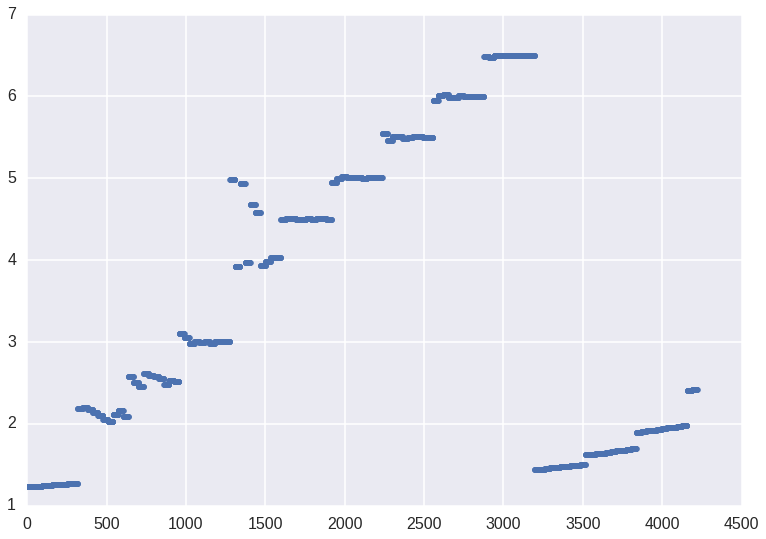

In [20]:
plot(df.sweep_primary_load_temperature,'.')

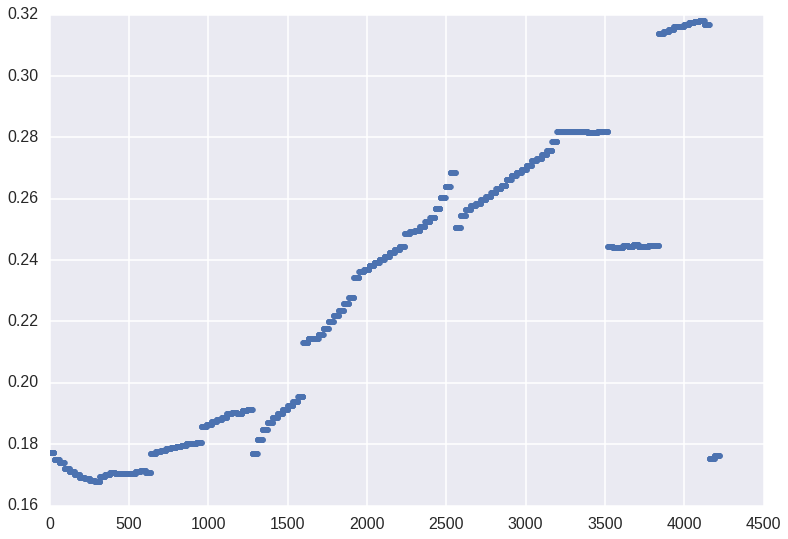

In [21]:
plot(df.sweep_primary_package_temperature,'.')

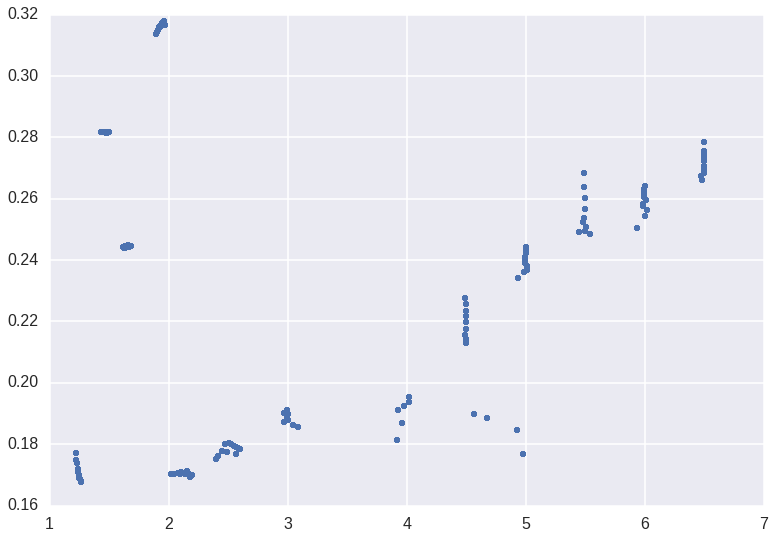

In [22]:
plot(df.sweep_primary_load_temperature,df.sweep_primary_package_temperature,'.')

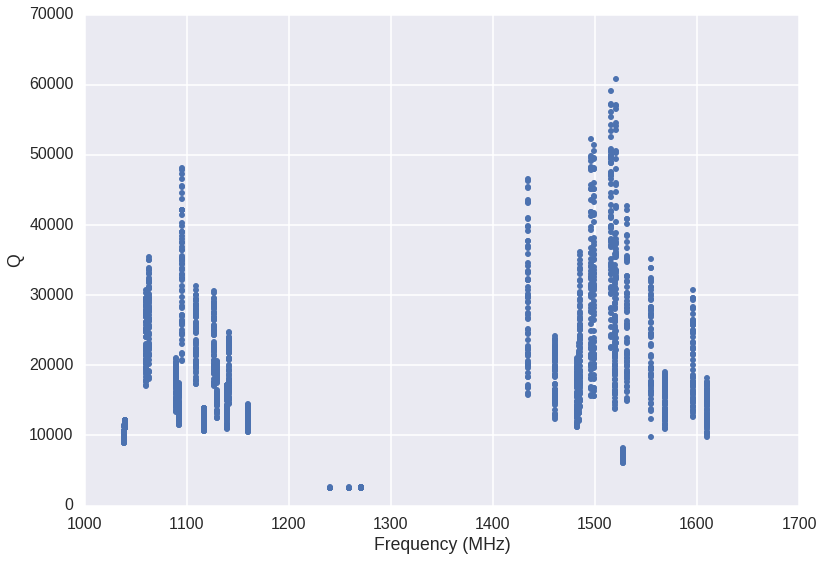

In [23]:
plot(df.f_0,df.Q,'.')
ylim(0,7e4)
xlabel('Frequency (MHz)')
ylabel('Q')